In [55]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob
import random
from PIL import Image, ImageDraw

%matplotlib inline

images = glob.glob('camera_cal/' + 'calibration*.jpg')

objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

# Prepare object points, like (0,0,0), (1,0,0), (2,0,0),..., (8,5,0)
objp = np.zeros((9*6, 3), np.float32) # 54x3
objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2) # 2x9x6 -> 6x9x2 -> 54x2

for fname in images:
    # Read in each image
    img = mpimg.imread(fname)
    
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
    
    # If corners are found, add object points, image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

calib_cam = {'ret': ret, 'mtx': mtx, 'dist': dist, 'rvecs': rvecs, 'tvecs': tvecs}

with open('calib_cam.p', 'wb') as f:
    pickle.dump(calib_cam, f, protocol=pickle.HIGHEST_PROTOCOL)

In [56]:
calib_cam = pickle.load( open( "calib_cam.p", "rb" ) )
mtx = calib_cam['mtx']
dist = calib_cam['dist']

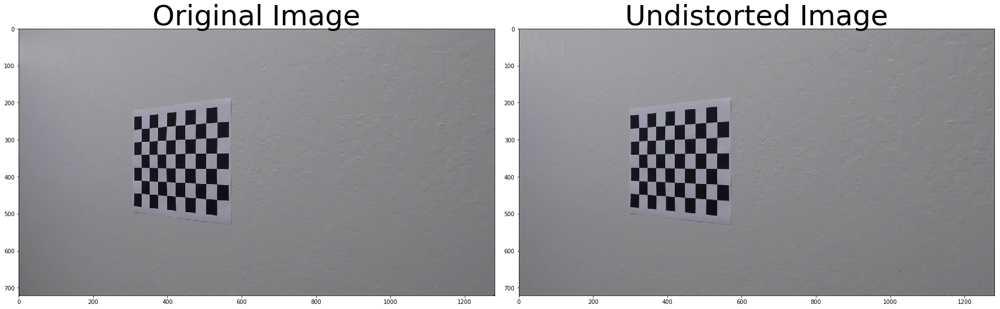

In [57]:
# Random Visualization
idx = random.randint(0, len(images)-1)
img = mpimg.imread(images[idx])

# Undistortion
img_undist = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(img_undist)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f.savefig("output_images/Undistortion.png")

# Correction of distorted images

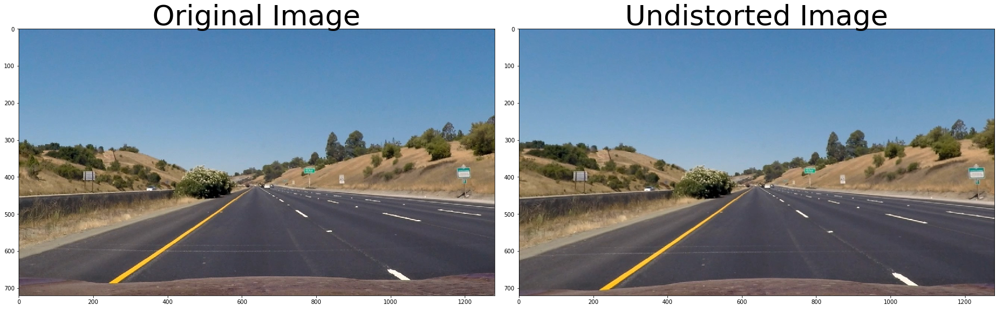

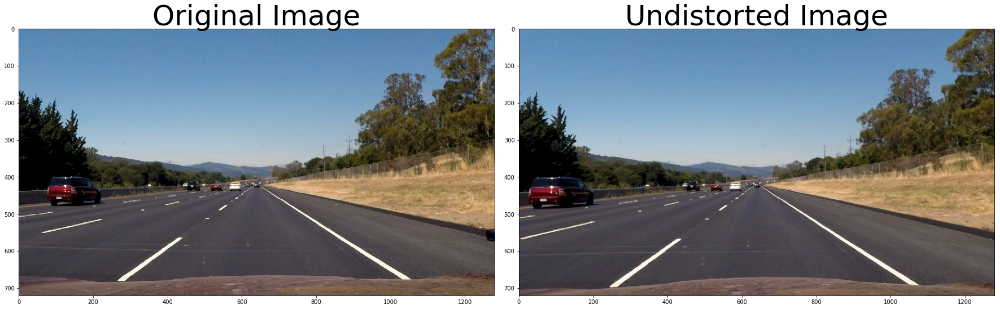

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


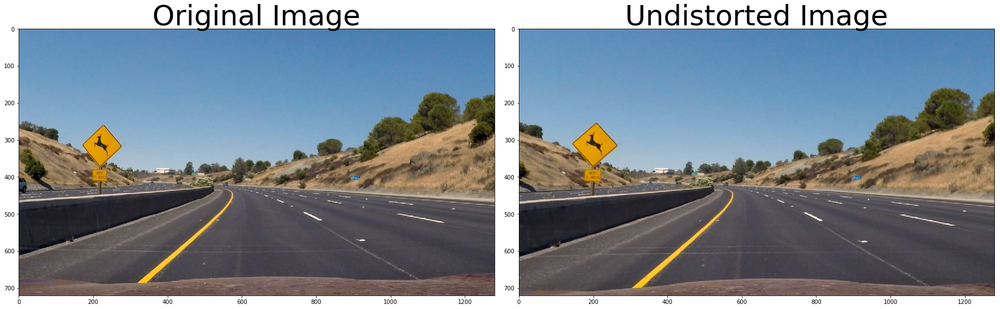

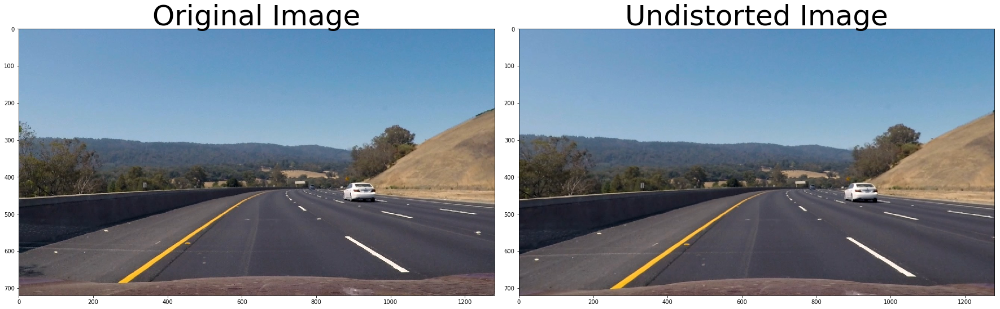

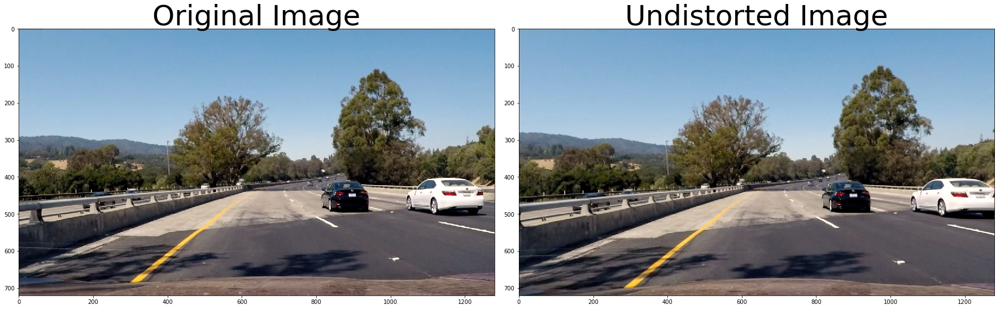

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


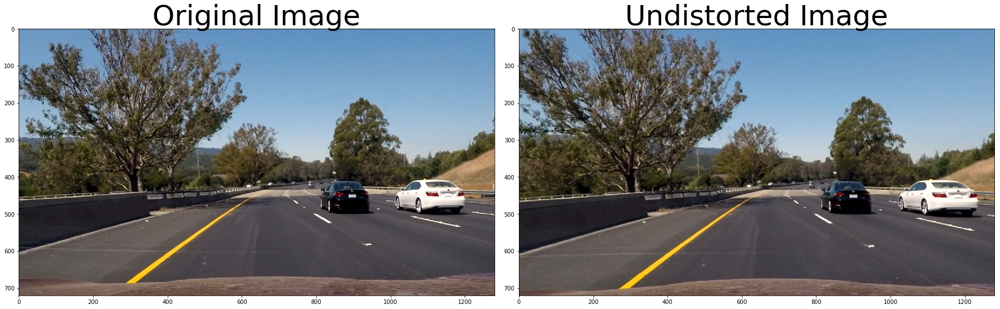

In [58]:
# Distortion correction
test_images = glob.glob('test_images/*.jpg')

for fname in test_images:
    img = mpimg.imread(fname)
    img_undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(img_undist)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    out = fname.split('/')
    outName = out[1].split('.')[0]
    f.savefig('output_images/' + 'undist_' + outName + '.png')

# Converted to binary images

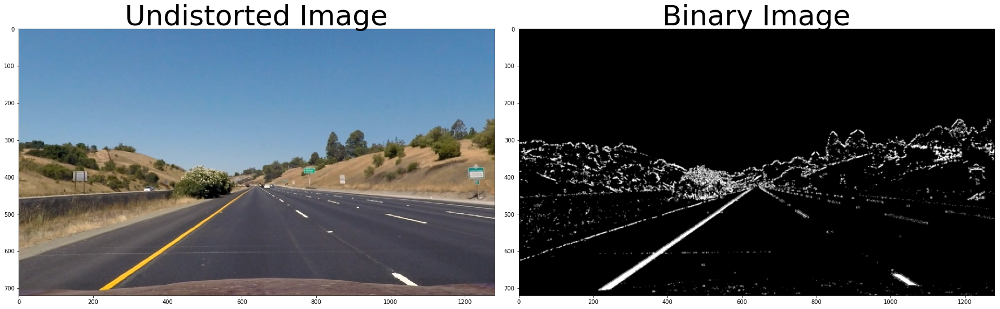

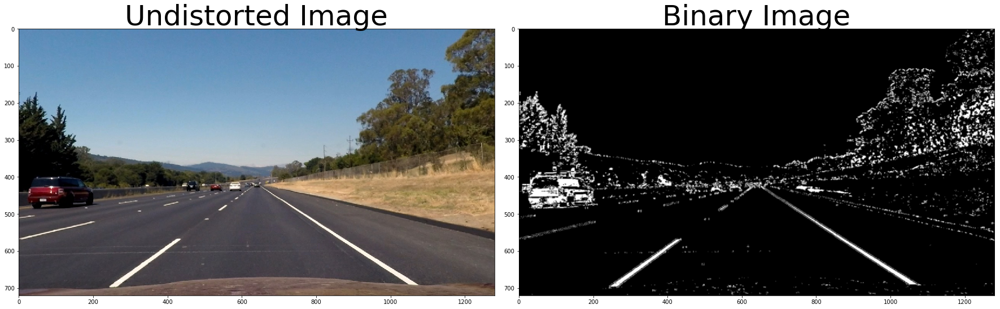

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


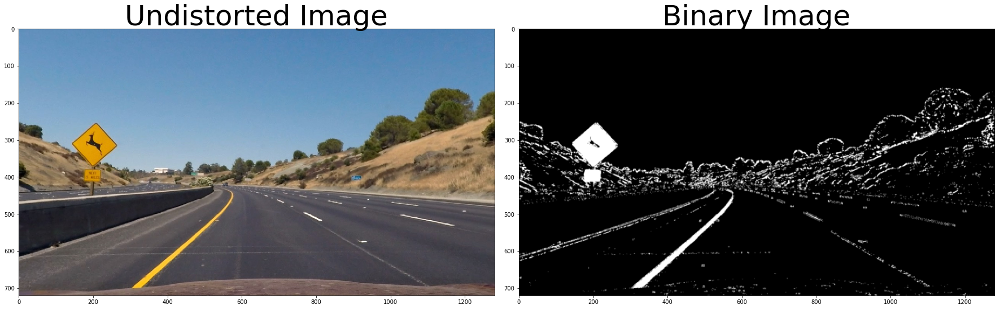

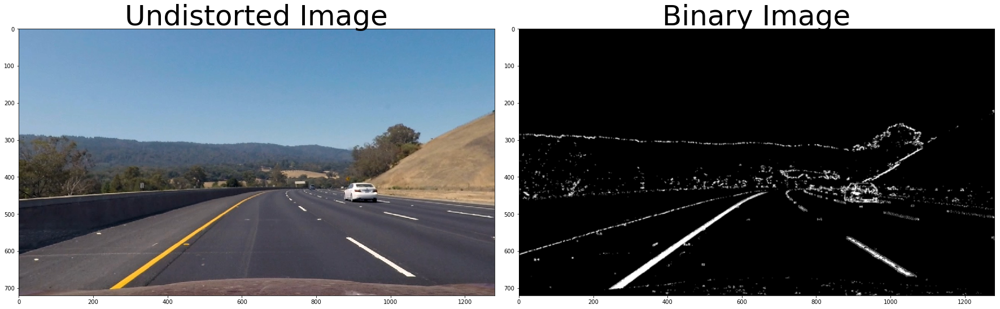

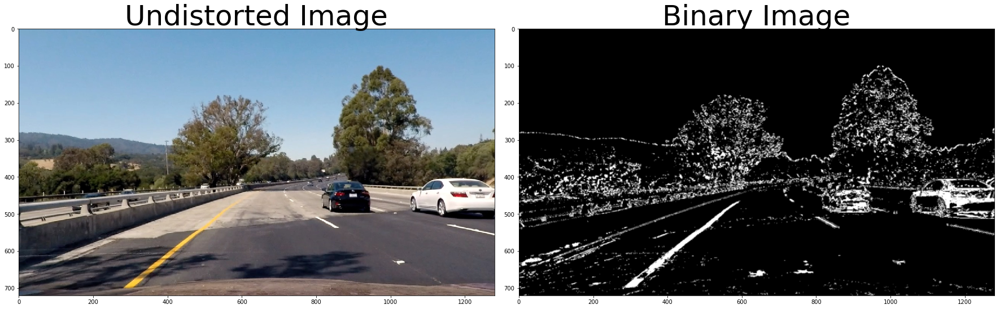

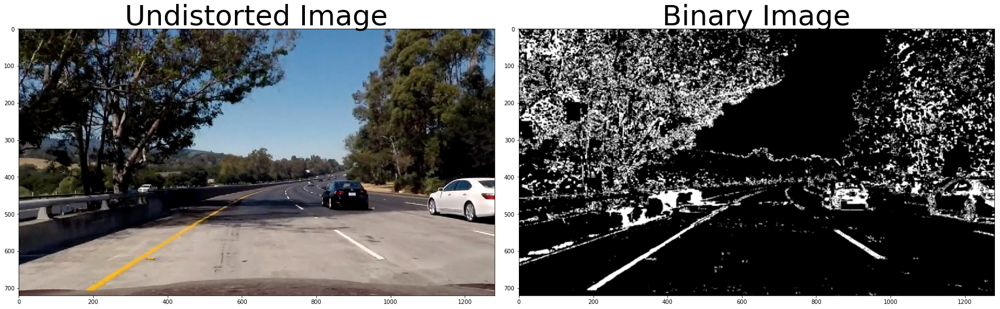

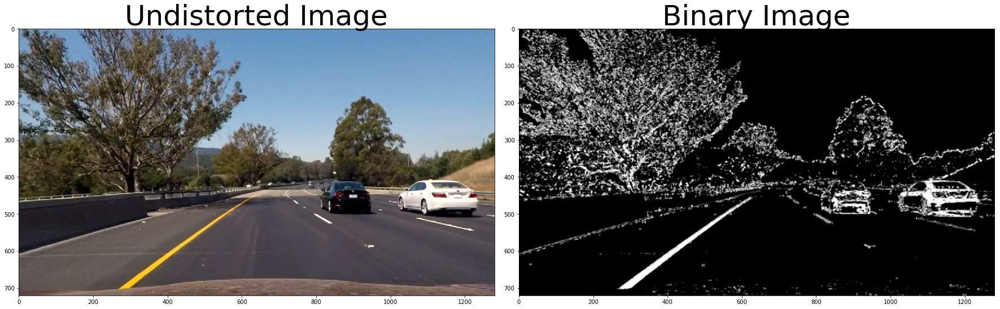

In [59]:
def blur(img, kernel_size=5, method='Gaussian'):
    """Applies a Gaussian/Median Noise kernel"""
    if method == 'Median':
        img = np.uint8(255 * img / np.max(img))
        return cv2.medianBlur(img, kernel_size)
    
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
        
    # Apply threshold
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as the grad_binary image
    return grad_binary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculate the magnitude 
    abs_sobel = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # Apply threshold
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1 
    # 6) Return this mask as the mag_binary image
    return mag_binary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    orient = np.arctan2(abs_sobely, abs_sobelx)
    
    # Apply threshold
    # 5) Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(orient)
    dir_binary[(orient >= thresh[0]) & (orient <= thresh[1])] = 1    
    # 6) Return this mask as the the dir_binary image
    return dir_binary

def hls_binary(img, s_thresh=(170, 255)):
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    return s_binary

def pipeline_prep(img, mtx, dist):
    img_undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img_undist, orient='x', sobel_kernel=3, thresh=(15, 150))
    grady = abs_sobel_thresh(img_undist, orient='y', sobel_kernel=5, thresh=(20, 100))
    mag_binary = mag_thresh(img_undist, sobel_kernel=9, mag_thresh=(30, 100))
    dir_binary = dir_threshold(img_undist, sobel_kernel=15, thresh=(0.7, 1.3))
    s_binary = hls_binary(img_undist, s_thresh=(150, 255))

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (s_binary == 1)] = 1

#     img_prep = blur(combined, kernel_size=3, method='Median')
    img_prep = blur(combined, kernel_size=5)
    
    return img_undist, img_prep

test_images = glob.glob('test_images/*.jpg')

for fname in test_images:
    img = mpimg.imread(fname)
    img_undist, img_prep = pipeline_prep(img, mtx, dist)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img_undist)
    ax1.set_title('Undistorted Image', fontsize=50)
    ax2.imshow(img_prep, cmap='gray')
    ax2.set_title('Binary Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    out = fname.split('/')
    outName = out[1].split('.')[0]
    f.savefig('output_images/' + 'Bin_' + outName + '.png')

In [60]:
def warper(img, H):
    img_size = (img.shape[1], img.shape[0])
    img_warped = cv2.warpPerspective(img, H, img_size, flags=cv2.INTER_LINEAR)
    
    return img_warped

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 1 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [61]:
test_images = glob.glob('test_images/*.jpg')
img = mpimg.imread(test_images[0])
img_size = (img.shape[1], img.shape[0])

# chose the hardcode the source and destination points for computing homography
src = np.float32(
    [[(img_size[0] / 2) - 64, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 64), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

print('src:', src)
print('dst:', dst)

H = cv2.getPerspectiveTransform(src, dst)
Hinv = cv2.getPerspectiveTransform(dst, src)

src: [[  576.           460.        ]
 [  203.33332825   720.        ]
 [ 1126.66662598   720.        ]
 [  704.           460.        ]]
dst: [[ 320.    0.]
 [ 320.  720.]
 [ 960.  720.]
 [ 960.    0.]]


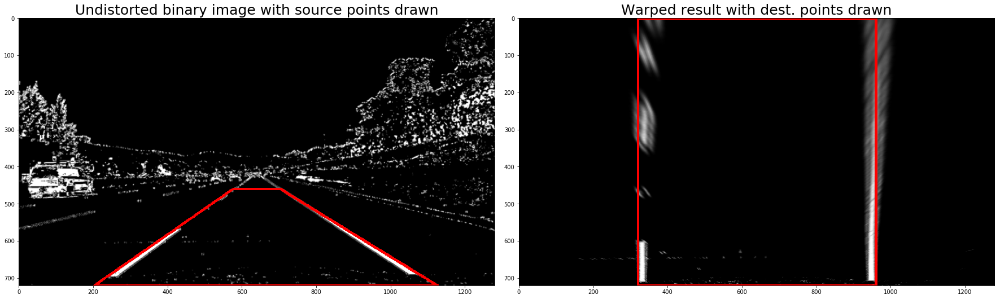

In [62]:
# Visualization
img = mpimg.imread(test_images[1])

_, img_bin = pipeline_prep(img, mtx, dist)
color_bin = np.dstack((img_bin, img_bin, img_bin))
color_bin = np.uint8(255 * color_bin / np.max(color_bin))

polypts = src.reshape((-1, 1, 2))
cv2.polylines(color_bin, np.int32([polypts]), True, (255, 0, 0), thickness=5)    
    
# Apply perspective transform to the binary image
img_warped = warper(img_bin, H)

color_warped = np.dstack((img_warped, img_warped, img_warped))
color_warped = np.uint8(255 * color_warped / np.max(color_warped))

polypts_warped = dst.reshape((-1, 1, 2))
cv2.polylines(color_warped, np.int32([polypts_warped]), True, (255, 0, 0), thickness=5)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(color_bin)
ax1.set_title('Undistorted binary image with source points drawn', fontsize=25)
ax2.imshow(color_warped)
ax2.set_title('Warped result with dest. points drawn', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

out = test_images[0].split('/')
outName = out[1].split('.')[0]
f.savefig('output_images/' + 'PT_' + outName + '.png')

# Lane detection

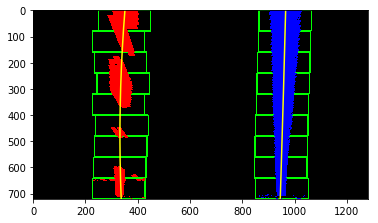

In [63]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30.0 / 720 # meters per pixel in y dimension
xm_per_pix = 3.7 / 700 # meters per pixel in x dimension
    
def detectLanesHist(binary_warped, isVideo=False):
    # Crop the region of interest
    vertices = np.array([[(.15*binary_warped.shape[1], binary_warped.shape[0]), (.15*binary_warped.shape[1], .0*binary_warped.shape[0])
                      , (.9*binary_warped.shape[1], .0*binary_warped.shape[0]), (.9*binary_warped.shape[1], binary_warped.shape[0])]], dtype=np.int32)
    binary_warped = region_of_interest(binary_warped, vertices)
    
    # Take a histogram of the bottom part of the image
    hist = np.sum(binary_warped[binary_warped.shape[0] // 2 + 100:, :], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped)))
#     out_img = np.dstack((binary_warped, binary_warped, binary_warped)).astype(np.uint8)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(hist.shape[0] / 2)
    leftx_base = np.argmax(hist[:midpoint])
    rightx_base = np.argmax(hist[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0] / nwindows)
    # Identify the x and y positions of all nonzeros pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_curr = leftx_base
    rightx_curr = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 60
    # Create empty lists to receive left and right lane pixel indices
    # The indices to pixel locations x, y
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_leftx_low = leftx_curr - margin
        win_leftx_high = leftx_curr + margin
        win_rightx_low = rightx_curr - margin
        win_rightx_high = rightx_curr + margin
        # Draw the windows
        if isVideo == False:
            cv2.rectangle(out_img, (win_leftx_low, win_y_low), (win_leftx_high, win_y_high), (0, 255, 0), 3)
            cv2.rectangle(out_img, (win_rightx_low, win_y_low), (win_rightx_high, win_y_high), (0, 255, 0), 3)

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_leftx_low) & (nonzerox < win_leftx_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_rightx_low) & (nonzerox < win_rightx_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_curr = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_curr = np.int(np.mean(nonzerox[good_right_inds]))
            
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right lane pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Visualization
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]  

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        
    if isVideo == False:
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, binary_warped.shape[1])
        plt.ylim(binary_warped.shape[0], 0)
        plt.savefig('./output_images/search.png')

    # Fit new polynomials to x, y in world space
    left_fit_cr = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
    
    return left_fit, left_fit_cr, right_fit, right_fit_cr

# Random Visualization
idx = random.randint(0, len(test_images) - 1)
img = mpimg.imread(test_images[idx])
img_undist, img_bin = pipeline_prep(img, mtx, dist)

img_warped = warper(img_bin, H)
# img_warped = np.uint8(255 * img_warped / np.max(img_warped))

left_fit, left_fit_cr, right_fit, right_fit_cr = detectLanesHist(img_warped)

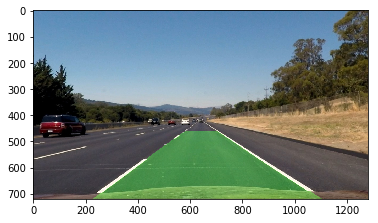

In [64]:
# Mark lane detections on original image
def markLanes(img_undist, img_warped, left_fit, right_fit, isVideo=False):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    ploty = np.linspace(0, img_warped.shape[0]-1, img_warped.shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2] 

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Hinv)
    newwarp = cv2.warpPerspective(color_warp, Hinv, (img_undist.shape[1], img_undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img_undist, 1, newwarp, 0.3, 0)
    
    if isVideo == False:
        plt.imshow(result)
        plt.savefig('./output_images/map_lanes.png')
        plt.show()
        
    return result

result = markLanes(img_undist, img_warped, left_fit, right_fit)